In [ ]:
# The code refers to https://www.youtube.com/watch?v=LNwODJXcvt4

In [1]:
!nvidia-smi

Tue Feb  6 10:28:45 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
!pip install ultralytics

from IPython import display
display.clear_output()
from IPython.display import display, Image

import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [4]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow
from roboflow import Roboflow

# connect to roboflow api
rf = Roboflow(api_key="gFe2wuQSuR0ZGI2uybFP")
project = rf.workspace("uceewl4").project("yolocustom-jwact")
dataset = project.version(6).download("yolov5-obb")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 9.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing ins

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to yolocustom-6 in yolov5-obb:: 100%|██████████| 1212/1212 [00:00<00:00, 6479.60it/s]


In [5]:
import os
!pip install roboflow

# data preprocessing for each file to get YOLOv5 bounding box format
def normalize_coordinates(coord, max_value):
    return float(coord) / max_value

class_names = ['bicycle', 'cabinet', 'chair', 'coffee_maker', 'fan', \
                       'kettle', 'lamp', 'mug', 'sofa', 'stapler', 'table', 'toaster']
class_indices = {name: index for index, name in enumerate(class_names)}
img_width, img_height = 500, 500

for i in ["train","valid","test"]:
    folder_path = f"/content/datasets/yolocustom-6/{i}/labels"
    for filename in os.listdir(folder_path):
        if filename.endswith(".txt"):  
            file_path = os.path.join(folder_path, filename)
            with open(file_path, 'r') as file:
                lines = file.readlines()

            new_lines = []
            for line in lines:
                parts = line.strip().split(' ')
                if len(parts) == 10:
                    label = parts[-2]
                    coords = parts[:8]
                    class_index = class_indices.get(label, -1)
                if class_index != -1:
                    normalized_coords = [normalize_coordinates(coords[i], \
                            img_width if i % 2 == 0 else img_height) for i in range(8)]
                    new_line = f"{class_index} " + " ".join(map(str, normalized_coords))
                    new_lines.append(new_line)

            with open(file_path, 'w') as file:
                file.write('\n'.join(new_lines))

In [6]:
# training
%cd {HOME}
!yolo task=obb mode=train model=yolov8s-obb.pt data={dataset.location}/data.yaml epochs=100 imgsz=500 batch=10

/content
100% 22.2M/22.2M [00:00<00:00, 227MB/s]
Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8s-obb.pt, data=/content/datasets/yolocustom-6/data.yaml, epochs=100, time=None, patience=50, batch=10, imgsz=500, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=

/content


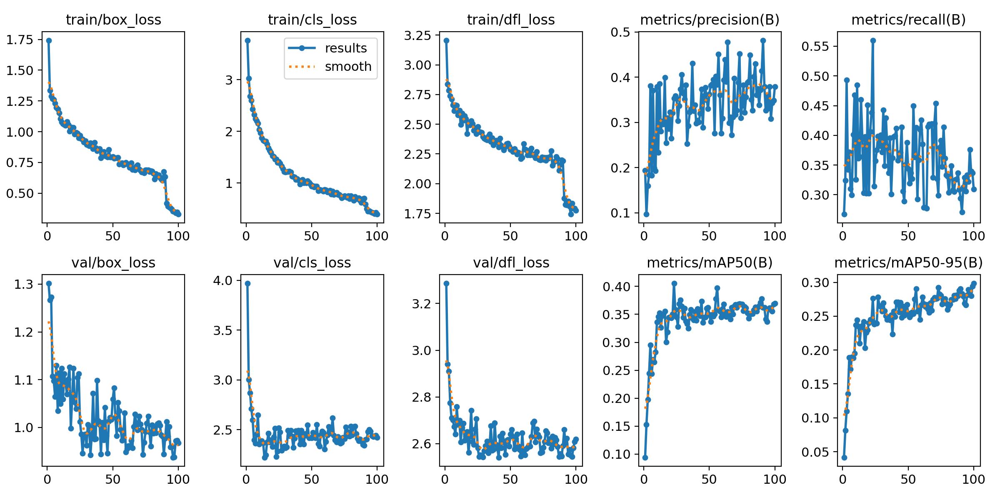

In [7]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/results.png', width=600)

/content


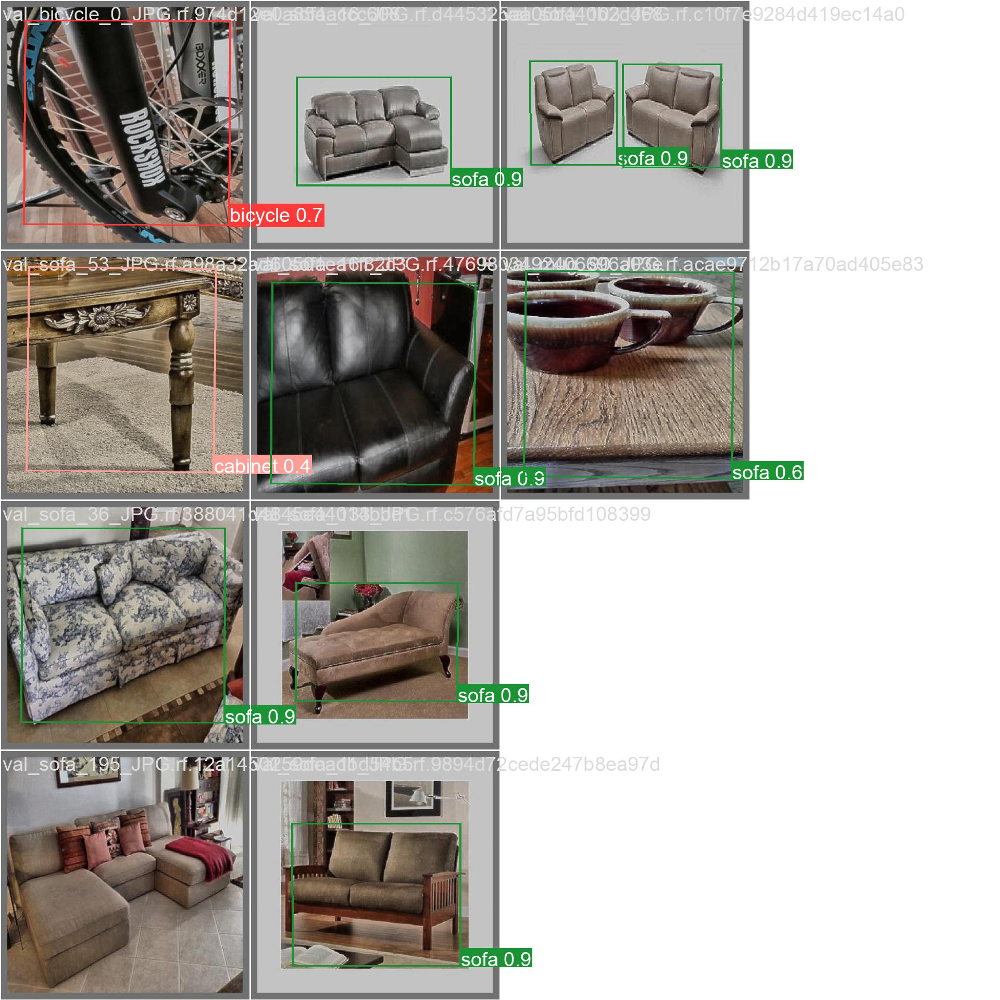

In [8]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/val_batch0_pred.jpg', width=600)

In [9]:
# validation
%cd {HOME}
!yolo task=obb mode=val model={HOME}/runs/obb/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-obb summary (fused): 187 layers, 11416215 parameters, 0 gradients, 29.4 GFLOPs
val: Scanning /content/datasets/yolocustom-6/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100% 120/120 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [00:04<00:00,  1.62it/s]
                   all        120        140      0.377      0.309       0.37      0.299
               bicycle        120         10      0.826        0.8      0.835      0.709
               cabinet        120         11      0.341      0.564      0.514      0.396
                 chair        120         13      0.508      0.154      0.204      0.165
          coffee_maker        120         12     0.0891     0.0833      0.207      0.172
                   fan        120         18      0.418      0.167      0.213      0.159
                kettle   

In [10]:
# testing
%cd {HOME}
!yolo task=obb mode=predict model={HOME}/runs/obb/train/weights/best.pt conf=0.2 source={dataset.location}/test/images save=true

/content
Ultralytics YOLOv8.1.9 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-obb summary (fused): 187 layers, 11416215 parameters, 0 gradients, 29.4 GFLOPs

image 1/120 /content/datasets/yolocustom-6/test/images/test_bicycle_0_JPG.rf.3eae02257c6286351aa50e1418fe8725.jpg: 512x512 27.5ms
image 2/120 /content/datasets/yolocustom-6/test/images/test_bicycle_10_JPG.rf.85792b3881308e354f185ea4ac30622e.jpg: 512x512 (no detections), 12.0ms
image 3/120 /content/datasets/yolocustom-6/test/images/test_bicycle_120_JPG.rf.1e84d7ffad4fe7e59949ce74c790f5b3.jpg: 512x512 11.9ms
image 4/120 /content/datasets/yolocustom-6/test/images/test_bicycle_184_JPG.rf.218ac3b309ab82338eb0a93b58ddab2e.jpg: 512x512 11.9ms
image 5/120 /content/datasets/yolocustom-6/test/images/test_bicycle_19_JPG.rf.0f8ff7ccc6472b8e75d15693d4aa00ed.jpg: 512x512 11.9ms
image 6/120 /content/datasets/yolocustom-6/test/images/test_bicycle_34_JPG.rf.4e65f8fdf721f92e24f9120c5108b53e.jpg: 512x512 11.9ms
image 7/120 /

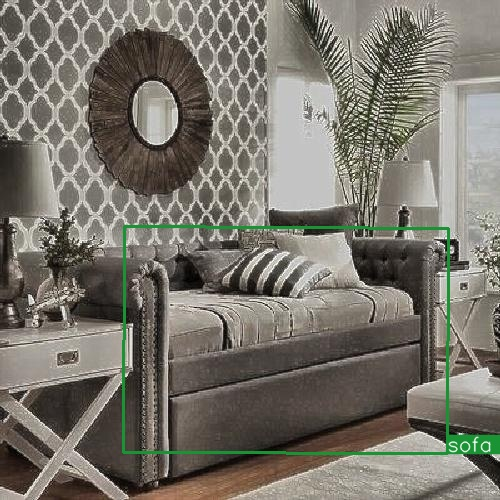

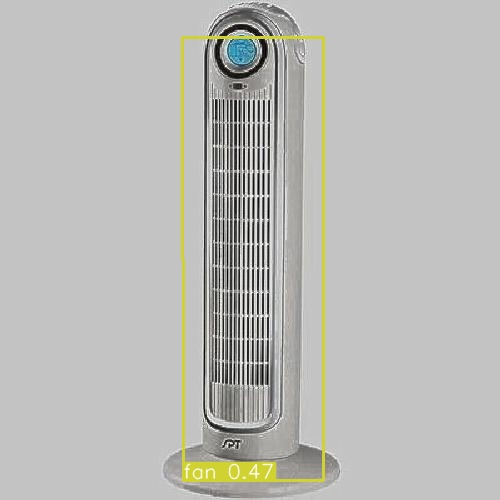

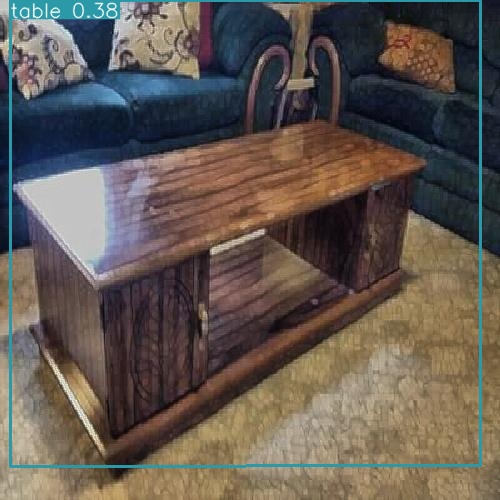

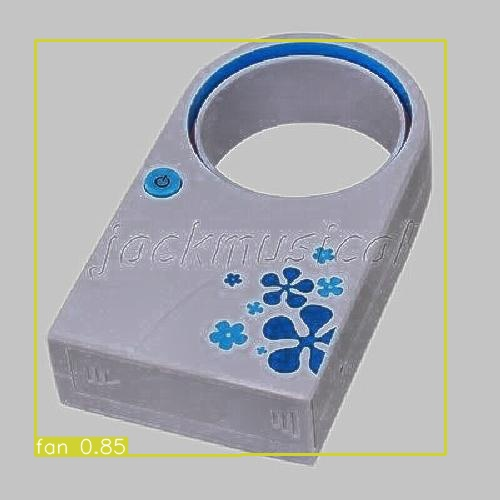

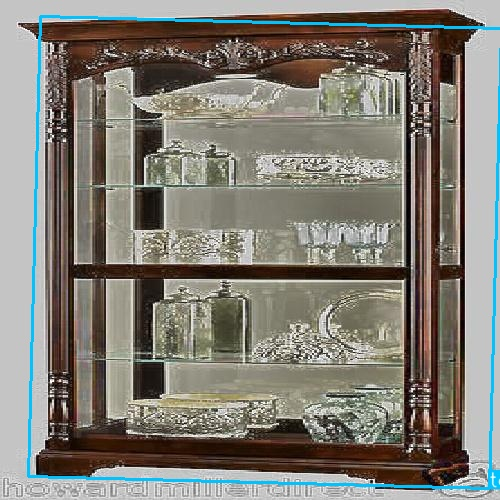

...

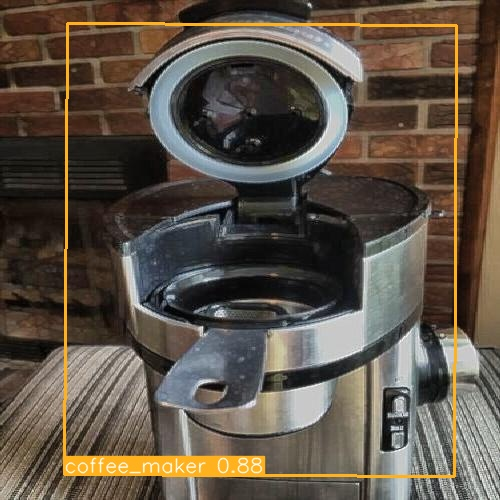

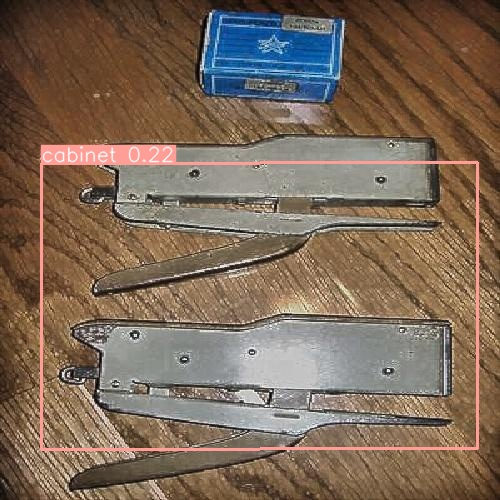

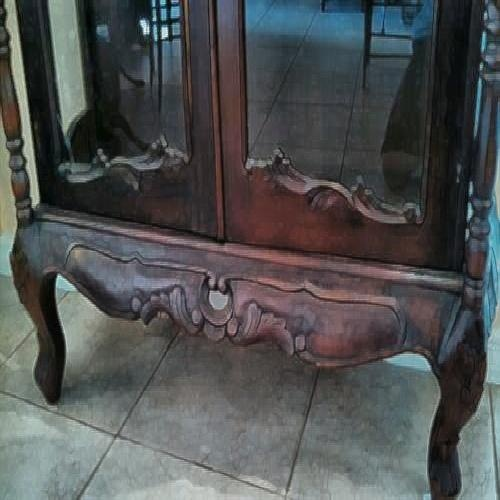

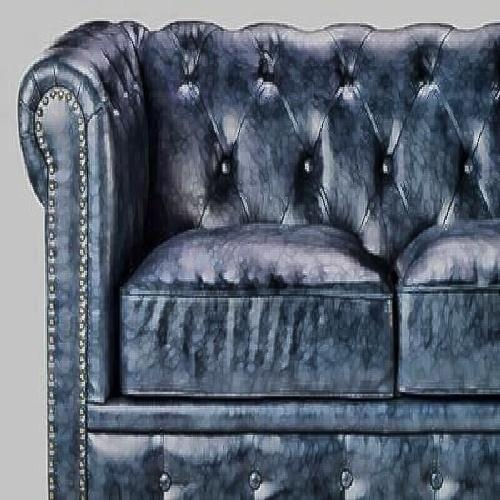

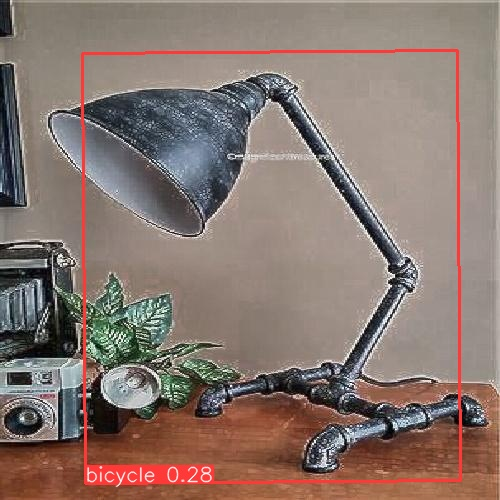

In [11]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/obb/predict/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")